<a href="https://colab.research.google.com/github/spaceBearAmadeus/Student_Need_Navigator_SCRATCH/blob/master/ROSE_Composer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!sudo apt install -y fluidsynth

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
The following additional packages will be installed:
  fluid-soundfont-gm libfluidsynth1 libqt5x11extras5 qsynth
Suggested packages:
  fluid-soundfont-gs timidity jackd
The following NEW packages will be installed:
  fluid-soundfont-gm fluidsynth libfluidsynth1 libqt5x11extras5 qsynth
0 upgraded, 5 newly installed, 0 to remove and 20 not upgraded.
Need to get 120 MB of archives.
After this operation, 150 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fluid-soundfont-gm all 3.1-5.1 [119 MB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libfluidsynth1 amd64 1.1.9-1 [137 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fluidsynth amd64 1.1.9-1 [20.7 kB]
Get:4 http://archi

In [2]:
!pip install --upgrade pyfluidsynth

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
!pip install pretty_midi

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 5.6 MB 30.8 MB/s 
     |████████████████████████████████| 51 kB 7.5 MB/s 
  Created wheel for pretty-midi: filename=pretty_midi-0.2.9-py3-none-any.whl size=5591955 sha256=7bbdc1a48244c4689ac14b6f45ad4573ee1042954ed54b0a396d6ddc3a40cb63
  Stored in directory: /root/.cache/pip/wheels/ad/74/7c/a06473ca8dcb63efb98c1e67667ce39d52100f837835ea18fa
Successfully built pretty-midi


In [4]:
import collections
import datetime
import fluidsynth
import glob
import numpy as np
import pathlib
import pandas as pd
import pretty_midi
import seaborn as sns
import tensorflow as tf

from IPython import display
from matplotlib import pyplot as plt
from typing import Dict, List, Optional, Sequence, Tuple

In [42]:
tf.random.set_seed(42)
np.random.seed(42)

AUDIO_DIR = pathlib.Path("data/maestro-v2.0.0")
ANNOTATIONS_FILE = "/content/data/maestro-v2.0.0/maestro-v2.0.0.csv"

if not AUDIO_DIR.exists():
  tf.keras.utils.get_file(
      'maestro-v2.0.0-midi.zip',
      origin='https://storage.googleapis.com/magentadata/datasets/maestro/v2.0.0/maestro-v2.0.0-midi.zip',
      extract=True,
      cache_dir='.', cache_subdir='data',
  )

In [111]:
class Bach: 
  def __init__(self, annotations_file, audio_dir, file_index:Optional[int]=None):  

    '''specifying file_index will bind a preconstructed pretty_midi object to the class
       based off of the param specified at instantiation, else you can use explicit
       methods to create a pretty midi object that is independent from any param within 
       the class'''

    self.annotations = pd.read_csv(f"{annotations_file}")
    self.audio_dir = audio_dir 
    self._SAMPLING_RATE = 44000
    if file_index:
      self.file_index = file_index 
      self.pretty_MIDI = self.__repr__(self.file_index)
      print(f"New Bach Instance Created at file location index: {file_index}\n")
    else:
      print(f"New Bach Instance Created!\n")

  def __len__(self):
    return len(self.annotations)

  def __getitem__(self, midi_file_index):
    audio_sample_path = self._get_audio_sample_path(midi_file_index)
    label = self._get_audio_sample_label(midi_file_index)
    return audio_sample_path, label 

  def __repr__(self, file_index):
    return self.get_pretty_midi(file_index)

  def _get_audio_sample_path(self, midi_file_index:Optional[int]=None):
    '''method will return the path of either an individual file specified by location index OR the entire directory'''
    filenames = glob.glob(str(self.audio_dir/'**/*.mid*'))
    return filenames[midi_file_index] if midi_file_index else filenames 

  def _get_audio_sample_label(self, midi_file_index):
    return self.annotations.iloc[midi_file_index, 6]
  
  def get_pretty_midi(self, midi_file_index:int):
    '''retrieves pretty_midi object'''
    pm = pretty_midi.PrettyMIDI(self.__getitem__(midi_file_index)[0])
    return pm

  #DATA VISUALIZATION METHODS
  def display_audio(self, pm:pretty_midi.PrettyMIDI, seconds=30):
    '''generates a mini .wav player in the markdown cell'''
    waveform = pm.fluidsynth(fs=self._SAMPLING_RATE)
    # Take a sample of the generated waveform to mitigate kernel resets
    waveform_short = waveform[:seconds*self._SAMPLING_RATE]
    return display.Audio(waveform_short, rate=self._SAMPLING_RATE)

  def fetch_inspect_MIDI_instrument(self, pm:pretty_midi.PrettyMIDI, show:Optional[bool]=False):
    '''retrieves instrument(s) in song, right now just [0], and shows data if show==True'''
    instrument = pm.instruments[0] 
    instrument_name = pretty_midi.program_to_instrument_name(instrument.program)
    if show:
      print("\n*-------------------------------------------*")
      print(f"{'            '} \033[1;36mINSTRUMENT INFORMATION\033[0m")
      print(f"*-------------------------------------------*")
      print(f"\033[0;34m{' '}NUMBER_OF_INSTRUMENTS:\033[0m {len(pm.instruments)}")
      print("*-------------------------------------------*")
      print(f"\033[0;34m{' '}INSTRUMENT_NAME:\033[0m {instrument_name}") 
      print("*-------------------------------------------*") 
      for i, note in enumerate(instrument.notes[:10]):
        note_name = pretty_midi.note_number_to_name(note.pitch)
        duration = note.end - note.start
        print(f"{' '}{i}: \033[0;31mPITCH\033[0m={note.pitch}, \033[0;32mNOTE_NAME\033[0m={note_name}, \033[0;33mDURATION\033[0m={duration:.4f}\n")
    print("*-------------------------------------------*") 
    print("\n")
    return instrument, instrument_name

  def midi_to_notes_df(self, 
                       midi_file_index:Optional[int]=None,
                       prettyMidi:Optional[pretty_midi.PrettyMIDI]=None, 
                       midi_file:Optional[str]=None) -> pd.DataFrame:
    '''if pm is given, default to the instantiated pm object, else custom index with same method!'''
    if midi_file_index:
      instrument = self.get_pretty_midi(midi_file_index).instruments[0]
    elif prettyMidi:
      instrument = prettyMidi.instruments[0]
    elif midi_file:
      pm = pretty_midi.PrettyMIDI(midi_file)
      instrument = pm.instruments[0]

    notes = collections.defaultdict(list)
    sorted_notes = sorted(instrument.notes, key=lambda note: note.start)#<-sort by start time
    prev_start = sorted_notes[0].start
    for note in sorted_notes:
      start = note.start 
      end = note.end
      notes['pitch'].append(note.pitch)
      notes['start'].append(start)
      notes['end'].append(end)
      notes['step'].append(start - prev_start)
      notes['duration'].append(end - start)
      prev_start = start
    
    return pd.DataFrame({name: np.array(value) for name, value in notes.items()})

  def get_note_names(self, df:pd.DataFrame) -> np.ndarray:
    '''remember that this produces a FUNC'''
    return np.vectorize(pretty_midi.note_number_to_name)

  def plot_piano_roll(self, notes:pd.DataFrame, count:Optional[int]=None):
    if count:
      title = f"First {count} notes"
      plt.figure(figsize=(28,12))
    else:
      title = f"Entire track"
      count = len(notes['pitch'])
      plt.figure(figsize=(32,12))
    
    x = np.stack([notes['pitch'], notes['pitch']], axis=0)
    y = np.stack([notes['start'], notes['end']], axis=0)
    plt.plot(y[:, :count], 
             x[:, :count], 
             color="m", 
             marker=".",
             markersize=8,
             markerfacecolor="b",
             snap=True)
    plt.xlabel('Time (s)')
    plt.ylabel('Pitch')
    _ = plt.title(title)

  def plot_note_distributions(self, notes_df:pd.DataFrame, drop_percentile=2.5):
    plt.figure(figsize=(16, 6))
    plt.subplot(1, 3, 1)
    sns.histplot(notes_df, x="pitch", bins=20, kde=True)

    plt.subplot(1, 3, 2)
    max_step = np.percentile(notes_df['step'], 100 - drop_percentile)
    sns.histplot(notes_df, x="step", bins=np.linspace(0, max_step, 21))

    plt.subplot(1, 3, 3)
    max_duration = np.percentile(notes_df['duration'], 100 - drop_percentile)
    sns.histplot(notes_df, x="duration", bins=np.linspace(0, max_step, 21))
  
  def notes_to_MIDI_file(
    self,
    notes:pd.DataFrame, 
    out_file:str, 
    instrument_name:str, 
    velocity:int=100) -> pretty_midi.PrettyMIDI:
    pm = pretty_midi.PrettyMIDI()
    instrument = pretty_midi \
                 .Instrument(program=pretty_midi \
                             .instrument_name_to_program(instrument_name))
    prev_start = 0 
    for i, note in notes.iterrows():
      start = float(prev_start + note['step'])
      end = float(start + note['duration'])
      note = pretty_midi.Note(velocity=velocity,
                              pitch=int(note['pitch']),
                              start=start,
                              end=end)
      instrument.notes.append(note)
      prev_start = start
    
    pm.instruments.append(instrument)
    pm.write(out_file)
    return pm 
    


rose = Bach(annotations_file=ANNOTATIONS_FILE, 
            audio_dir=AUDIO_DIR, 
            file_index=666)


kita = Bach(annotations_file=ANNOTATIONS_FILE,
            audio_dir=AUDIO_DIR,
            file_index=None)

New Bach Instance Created at file location index: 666

New Bach Instance Created!



In [75]:
rose.display_audio(rose.pretty_MIDI)

In [84]:
pm = kita.get_pretty_midi(669) #<-index number of the sample we are inspecting
kita.display_audio(pm)

In [85]:
instrument1 = rose.fetch_inspect_MIDI_instrument(rose.pretty_MIDI, show=True)


*-------------------------------------------*
             INSTRUMENT INFORMATION
*-------------------------------------------*
 NUMBER_OF_INSTRUMENTS: 1
*-------------------------------------------*
 INSTRUMENT_NAME: Acoustic Grand Piano
*-------------------------------------------*
 0: PITCH=68, NOTE_NAME=G#4, DURATION=0.3990

 1: PITCH=65, NOTE_NAME=F4, DURATION=1.1250

 2: PITCH=77, NOTE_NAME=F5, DURATION=0.2240

 3: PITCH=72, NOTE_NAME=C5, DURATION=0.7469

 4: PITCH=56, NOTE_NAME=G#3, DURATION=1.5750

 5: PITCH=77, NOTE_NAME=F5, DURATION=0.4094

 6: PITCH=67, NOTE_NAME=G4, DURATION=1.0990

 7: PITCH=76, NOTE_NAME=E5, DURATION=0.4469

 8: PITCH=79, NOTE_NAME=G5, DURATION=0.3781

 9: PITCH=58, NOTE_NAME=A#3, DURATION=1.4594

*-------------------------------------------*




In [86]:
instrument2 = kita.fetch_inspect_MIDI_instrument(pm)

*-------------------------------------------*




In [87]:
#these perform the same function but using different params to specify different files:
song1 = rose.midi_to_notes_df(prettyMidi=rose.pretty_MIDI)

song2_cust_i = kita.midi_to_notes_df(midi_file_index=6)

In [88]:
#note_name_array = rose.get_note_names(pm_df['pitch'])
song1

,pitch,start,end,step,duration
0,56,1.072917,2.647917,0.000000,1.575000
1,65,1.075000,2.200000,0.002083,1.125000
2,53,1.097917,9.455208,0.022917,8.357292
3,68,1.501042,1.900000,0.403125,0.398958
4,72,1.859375,2.606250,0.358333,0.746875
...,...,...,...,...,...
1861,64,350.508333,351.203125,0.576042,0.694792
1862,41,351.618750,355.058333,1.110417,3.439583
1863,57,351.703125,354.889583,0.084375,3.186458
1864,60,351.796875,354.813542,0.093750,3.016667


In [89]:
song2_cust_i

,pitch,start,end,step,duration
0,67,0.158854,4.994792,0.000000,4.835937
1,65,1.002604,1.244792,0.843750,0.242188
2,63,1.647135,1.851562,0.644531,0.204427
3,61,2.291667,2.490885,0.644531,0.199219
4,59,2.897135,3.067708,0.605469,0.170573
...,...,...,...,...,...
5728,61,838.971354,839.411458,0.373698,0.440104
5729,97,841.184896,845.710938,2.213542,4.526042
5730,94,841.231771,842.630208,0.046875,1.398438
5731,37,841.264323,841.739583,0.032552,0.475260


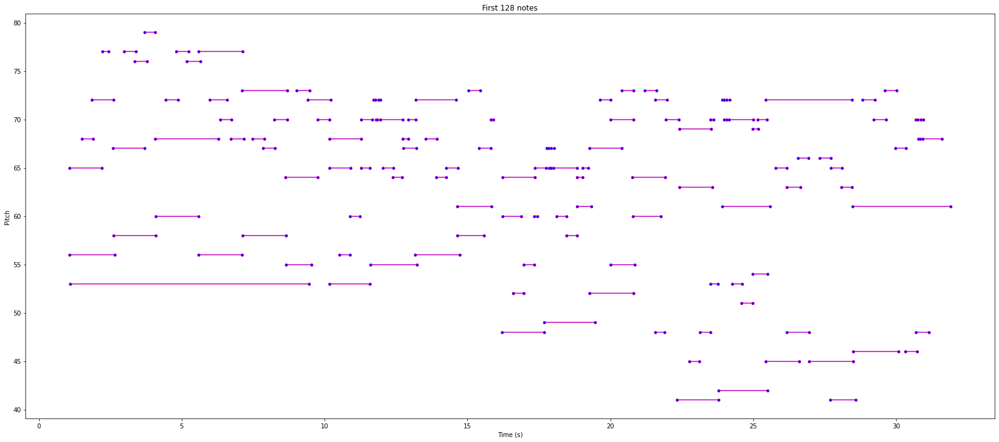

In [90]:
rose.plot_piano_roll(song1, count=128)

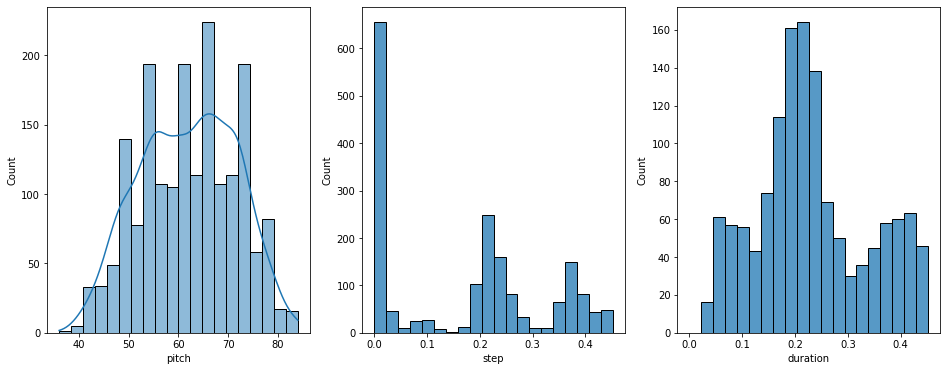

In [91]:
rose.plot_note_distributions(song1)

In [92]:
EXAMPLE = 'example.midi'
example_midi_file = rose.notes_to_MIDI_file(notes=song1,
                                            out_file=EXAMPLE,
                                            instrument_name=instrument1[1])

In [93]:
rose.display_audio(example_midi_file)

In [114]:
class Amadeus(Bach):
  
  '''Amadeus is the class that inherits from Bach the ability to fetch and read music.
     Now this class will learn the music!'''

  '''You cant make a pretty midi object without a file_index, thus a child class that is 
     instantiated without this param will ALSO be devoid of a pretty midi attribute. Calling
     the file index in the child class will trigger the 'file_index' block of the parent class
     init!'''
  
  def __init__(self, sampling_rate:Optional[int]=None, file_index:Optional[int]=None):
    super().__init__(ANNOTATIONS_FILE, AUDIO_DIR, file_index)#call here even if not required!
    #custom sampling rate
    if sampling_rate is not None:
      self.sampling_rate = sampling_rate
    

  def create_training_dataset(self):
    num_files = 5
    all_notes = []
    for files in super()._get_audio_sample_path()[:num_files]:
      notes = super().midi_to_notes_df(files)
      print(type(notes))
      all_notes.append(notes)
    all_notes = pd.concat(all_notes)
    print(all_notes)
    #n_notes = len(all_notes)
    #print(f"Number of notes parsed: {n_notes}")
    #return all_notes



mozart = Amadeus()

hayden = Amadeus(sampling_rate=16000,
                 file_index=rose.file_index)

New Bach Instance Created!

New Bach Instance Created at file location index: 666



In [119]:
hmp = hayden.pretty_MIDI.estimate_tempi()
print(hmp)

(array([228.19015847, 227.16914987, 164.90797546, 228.5421733 ,
       165.10402219, 161.18824669, 165.12900704, 152.70413574,
       165.13761468, 165.24233731, 222.25832656, 227.43142145,
       224.63054187, 222.15556032, 164.15758592, 222.79863481,
       226.82418346, 223.0523918 , 163.78176648, 149.37759336,
       220.85889571, 162.09045226, 223.68932039, 146.93877551,
       223.93779506, 165.18861681, 223.45568487, 163.81535769,
       223.85650224, 220.95013278, 219.91727649, 163.05732484,
       228.19412347, 223.17717506, 223.8869258 , 144.        ,
       214.04682274, 163.91576551, 219.51219512, 219.93127148,
       162.50783699, 164.25855513, 162.96762025, 204.16482056,
       228.11881188, 226.54867257, 225.12562814, 210.98901099,
       227.02702703, 226.89926843, 227.96833773, 210.98901099,
       205.83680762, 216.4057608 , 218.18181818, 212.41548863,
       228.11881188, 226.03008502, 220.12738854, 165.13761468,
       226.95035461, 217.68707483, 222.73781903, 187.9